<a href="https://colab.research.google.com/github/Nair987/Courseworks/blob/main/CourseWork_Data_Visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#You are to carry out a visual data exploration for ChrisCo, the fictional company whose sales and website data we have been analysing throughout the module, using a Python Notebook (in Colab or Jupyter). 
#ChrisCo is a fictional, but nonetheless very successful company managing a range of retail outlets across the UK. ChrisCo collects a huge amount of data about individual customers visiting its outlets using its loyalty card scheme but this customer data has been aggregated/averaged to give information about the company’s 45 outlets, each identified by a unique 3 letter code (e.g. ABC, XYZ, etc).

# Importing Libraries

In [1]:
!pip install --upgrade hvplot panel bokeh ipykernel holoviews ipywidgets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 39.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 69.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 KB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.3/138.3 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.3/793.3 KB 32.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 34.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.8/385.8 KB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 45.3 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.3
    Uninstalling widgetsnbextension-3.6.3:
      Successfully uninstalled widgetsnbextension-3.6.3
  Attempting uninstall: prompt-toolkit
    Found existing ins

In [2]:
import pandas as pd
import numpy as np
import hvplot.pandas
import holoviews as hv
import panel as pn

pn.extension(comms='colab')

import matplotlib.pyplot as plt
import seaborn as sns

##DataFrame 1: Contains the daily number of customer visits to company's outlets

In [3]:
df = pd.read_csv('https://tinyurl.com/ChrisCoDV/001281633/OutletDailyCustomers.csv',index_col=0)  
df.index = pd.to_datetime(df.index)
df.head()

,HZQ,FZI,AYD,HNV,QZF,MZO,HTF,RFY,END,PFQ,...,ZYT,EHT,EYS,NLT,DZZ,IFI,MTE,YMQ,YGE,DHJ
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,46,93,0,62,69,63,86,2089,68,68,...,67,74,965,74,51,64,47,0,64,73
2021-01-02,76,61,0,49,75,70,75,1690,99,49,...,81,72,1049,57,62,86,62,0,63,98
2021-01-03,69,77,0,56,81,80,80,2202,100,86,...,60,59,1064,69,71,113,72,0,69,94
2021-01-04,61,63,0,58,68,69,98,1105,79,75,...,60,94,858,66,55,96,61,0,63,68
2021-01-05,67,81,0,63,64,74,100,1839,65,82,...,68,44,777,73,78,32,62,0,69,83


#Finding out the mean , minimum , maximum

In [4]:
df.describe()

,HZQ,FZI,AYD,HNV,QZF,MZO,HTF,RFY,END,PFQ,...,ZYT,EHT,EYS,NLT,DZZ,IFI,MTE,YMQ,YGE,DHJ
count,365.000000,365.00000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.00000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,66.506849,81.50137,37.306849,43.742466,72.504110,70.463014,47.660274,1770.208219,86.50411,70.230137,...,16.200000,72.438356,987.717808,67.819178,61.060274,76.473973,63.010959,17.882192,50.389041,86.298630
std,6.929241,9.51535,47.314636,25.727214,5.813787,12.828834,48.543904,354.840020,12.37323,13.273814,...,28.490137,13.203798,136.675097,10.813614,11.120552,16.435606,7.740637,23.563681,29.669922,15.726583
min,46.000000,58.00000,0.000000,0.000000,55.000000,35.000000,0.000000,634.000000,51.00000,32.000000,...,0.000000,42.000000,531.000000,37.000000,28.000000,32.000000,42.000000,0.000000,0.000000,41.000000
25%,62.000000,75.00000,0.000000,0.000000,69.000000,62.000000,0.000000,1537.000000,79.00000,61.000000,...,0.000000,63.000000,888.000000,60.000000,53.000000,65.000000,58.000000,0.000000,0.000000,76.000000
50%,67.000000,81.00000,12.000000,56.000000,73.000000,71.000000,0.000000,1785.000000,86.00000,70.000000,...,0.000000,73.000000,995.000000,68.000000,61.000000,76.000000,63.000000,0.000000,65.000000,86.000000
75%,71.000000,88.00000,68.000000,61.000000,77.000000,79.000000,96.000000,2027.000000,95.00000,79.000000,...,0.000000,82.000000,1077.000000,75.000000,68.000000,87.000000,67.000000,36.000000,70.000000,97.000000
max,85.000000,106.00000,252.000000,71.000000,88.000000,112.000000,121.000000,2772.000000,121.00000,102.000000,...,81.000000,113.000000,1370.000000,101.000000,89.000000,115.000000,86.000000,92.000000,85.000000,133.000000


### Exploratory Data Analysis

# Lets first sort the data according to the mean of each column, largest first

In [5]:
df = df.reindex(df.mean().sort_values(ascending=False).index, axis=1) 
print(df.mean())



RAN    2029.342466
DMN    1874.506849
RFY    1770.208219
EYS     987.717808
DSA     959.745205
EEC     920.419178
BMF     854.676712
BSQ     828.928767
CYK     778.956164
CGV     675.950685
OZW      95.901370
PLB      88.063014
DTO      87.117808
END      86.504110
DHJ      86.298630
NFH      84.495890
FZI      81.501370
LLK      79.498630
OTL      78.495890
IFI      76.473973
CNW      75.589041
LTU      75.416438
GNL      74.890411
FTW      72.950685
QZF      72.504110
EHT      72.438356
MZO      70.463014
PFQ      70.230137
NLT      67.819178
HZQ      66.506849
CTH      64.490411
MTE      63.010959
GFA      61.947945
DZZ      61.060274
YGE      50.389041
HTF      47.660274
HNV      43.742466
IZX      41.016438
XSB      37.567123
AYD      37.306849
ZSJ      29.380822
YMQ      17.882192
ZMY      17.468493
ZYT      16.200000
AGN      12.082192
dtype: float64


#From the above averaged data we have observed: 
##Outlet 'RAN' has the highest number of footfall in comparison to the other 45 outlets. 
##Outlet 'AGN' has the highest number of footfall in comparison to the other 45 outlets.


## For more Clarity lets draw a bar graph


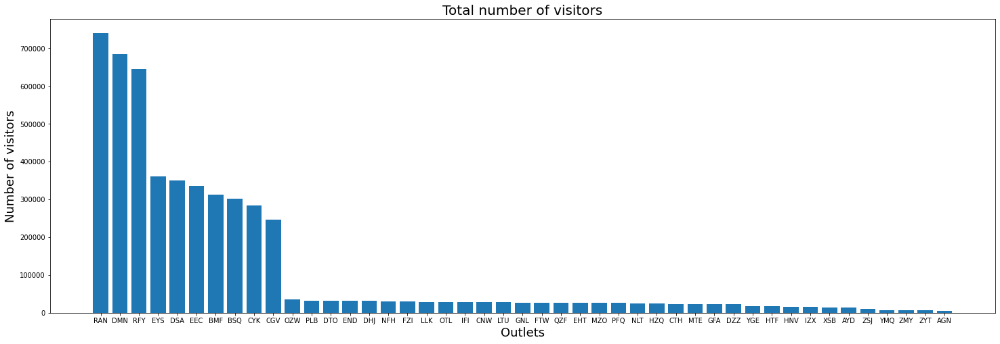

In [6]:
plt.figure(figsize=(25,8))
x_pos = np.arange(len(df.columns))
plt.bar(x_pos, df.sum(), align='center')
plt.xticks(x_pos, df.columns)
plt.xlabel('Outlets', fontsize=18)
plt.ylabel('Number of visitors', fontsize=18)
plt.title('Total number of visitors', fontsize=20)
plt.show()

# Categorizing the whole data into 4 subcategory, ie. High, Medium, Low

In [7]:
categories = ['High', 'Medium', 'Low']
categories_selected = [[] for i in range(len(categories))]
for name in df.columns:
    total_sales = df[name].sum()
    if total_sales > 400000:
        category = 0
    elif total_sales > 200000:
        category = 1
    else:
        category = 2
    categories_selected[category].append(name)
      
for i in range(len(categories)):
  print(categories[i] + ': ' + str(categories_selected[i]))
   

High: ['RAN', 'DMN', 'RFY']
Medium: ['EYS', 'DSA', 'EEC', 'BMF', 'BSQ', 'CYK', 'CGV']
Low: ['OZW', 'PLB', 'DTO', 'END', 'DHJ', 'NFH', 'FZI', 'LLK', 'OTL', 'IFI', 'CNW', 'LTU', 'GNL', 'FTW', 'QZF', 'EHT', 'MZO', 'PFQ', 'NLT', 'HZQ', 'CTH', 'MTE', 'GFA', 'DZZ', 'YGE', 'HTF', 'HNV', 'IZX', 'XSB', 'AYD', 'ZSJ', 'YMQ', 'ZMY', 'ZYT', 'AGN']


## Analysing Outlets having High visitors


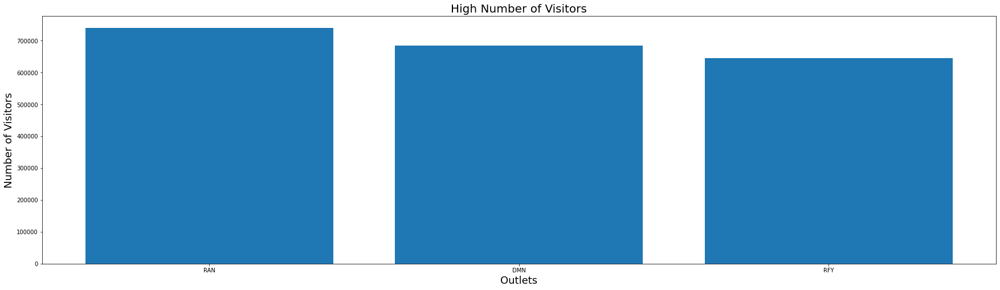

In [8]:
selected= ['RAN', 'DMN', 'RFY']
plt.figure(figsize=(30, 8))
x_pos = np.arange(len(df[selected].columns))
plt.bar(x_pos, df[selected].sum(), align='center')
plt.xticks(x_pos, df[selected].columns)
plt.xlabel('Outlets', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('High Number of Visitors', fontsize=20)
plt.show()


In [9]:
df[selected].head()

,RAN,DMN,RFY
Date,,,
2021-01-01,2210,2417,2089
2021-01-02,1919,1771,1690
2021-01-03,2084,2124,2202
2021-01-04,1994,1620,1105
2021-01-05,1636,1877,1839


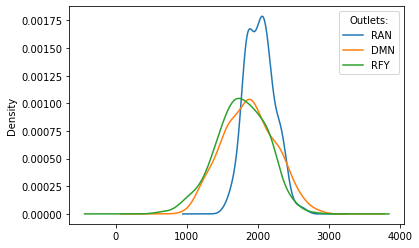

In [10]:
df[selected].plot.density()
plt.legend(title='Outlets:')
plt.show()

## Analysing Outlets having Medium visitors


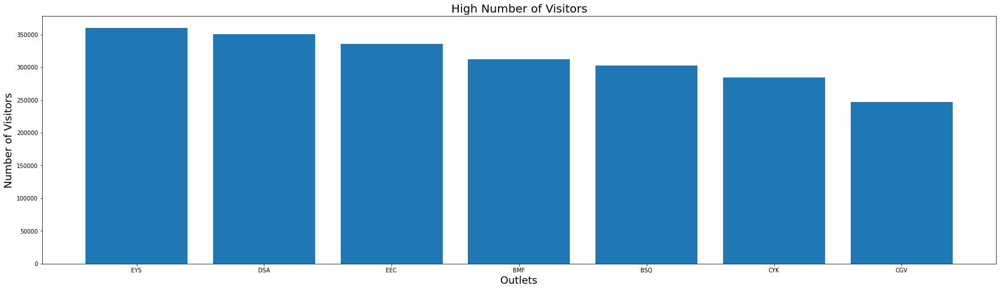

In [11]:
selected= ['EYS', 'DSA', 'EEC', 'BMF', 'BSQ', 'CYK', 'CGV']
plt.figure(figsize=(30, 8))
x_pos = np.arange(len(df[selected].columns))
plt.bar(x_pos, df[selected].sum(), align='center')
plt.xticks(x_pos, df[selected].columns)
plt.xlabel('Outlets', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('High Number of Visitors', fontsize=20)
plt.show()


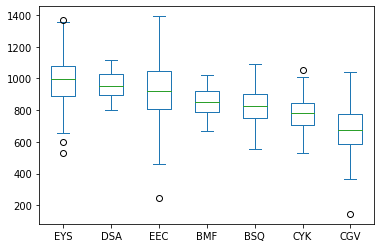

<function matplotlib.pyplot.show(close=None, block=None)>

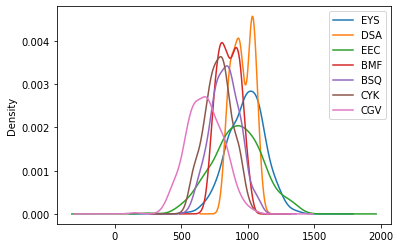

In [12]:
df[selected].plot.box()
plt.show()
df[selected].plot.density()
plt.show

In [13]:
def get_line_plot(store, window_size, date_range):
    if store == 'High':
        selected = ['RAN', 'DMN', 'RFY']
    elif store == 'Medium':
        selected = ['EYS', 'DSA', 'EEC', 'BMF', 'BSQ', 'CYK', 'CGV']  
    else:
        selected = ['OZW', 'PLB', 'DTO', 'END', 'DHJ', 'NFH', 'FZI', 'LLK', 'OTL', 'IFI', 'CNW', 'LTU', 'GNL', 'FTW', 'QZF', 'EHT', 'MZO', 'PFQ', 'NLT', 'HZQ', 'CTH', 'MTE', 'GFA', 'DZZ', 'YGE', 'HTF', 'HNV', 'IZX', 'XSB', 'AYD', 'ZSJ','YMQ', 'ZMY', 'ZYT', 'AGN']
    dt = df[selected] 
    dt = dt.rolling(window=window_size).mean() 
    dt = dt.loc[pd.to_datetime(date_range[0]) : pd.to_datetime(date_range[1])] 
    return dt.hvplot.line(frame_width=1000, grid=True)


time_title = '## Time-Series'

store = ['High', 'Medium', 'Low',]

store = pn.widgets.Select(name='Store', options=store, width=200)
day_avg = pn.widgets.IntSlider(name='Day average', value=7, start=1, end=21, width=200)
time_date_range = pn.widgets.DateRangeSlider(name='Dates', width=200,
                                        value=(df.index[0], df.index[-1]),
                                        start=df.index[0], end=df.index[-1])

time_row = pn.Row(
    pn.Column(time_title, store, day_avg, time_date_range),
    get_line_plot(store.value, day_avg.value, time_date_range.value)
)

def update_time_row(event):
    time_row[1].object = get_line_plot(store.value, day_avg.value, time_date_range.value)

store.param.watch(update_time_row, 'value')
day_avg.param.watch(update_time_row, 'value')
time_date_range.param.watch(update_time_row, 'value')

time_row.servable()

Row
    [0] Column
        [0] Markdown(str)
        [1] Select(name='Store', options=['High', 'Medium', 'Low'], value='High', width=200)
        [2] IntSlider(end=21, name='Day average', start=1, value=7, width=200)
        [3] DateRangeSlider(end=Timestamp('2021-12-31 0..., name='Dates', start=Timestamp('2021-01-01 0..., value=(Timestamp('2021-01-01 00:..., value_end=Timestamp('2021-12-31 0..., value_start=Timestamp('2021-01-01 0..., width=200)
    [1] HoloViews(NdOverlay, height=300, sizing_mode='fixed')

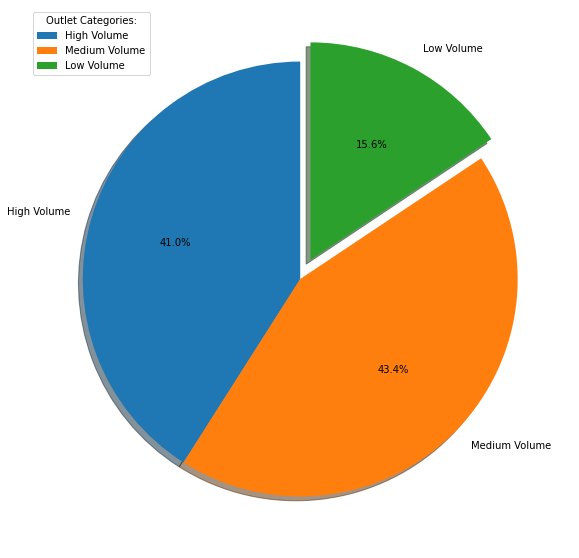

In [14]:
High=['RAN', 'DMN', 'RFY']
Medium=['EYS', 'DSA', 'EEC', 'BMF', 'BSQ', 'CYK', 'CGV']
Low=['OZW', 'PLB', 'DTO', 'END', 'DHJ', 'NFH', 'FZI', 'LLK', 'OTL', 'IFI', 'CNW', 'LTU', 'GNL', 'FTW', 'QZF', 'EHT', 'MZO', 'PFQ', 'NLT', 'HZQ', 'CTH', 'MTE', 'GFA', 'DZZ', 'YGE', 'HTF', 'HNV', 'IZX', 'XSB', 'AYD', 'ZSJ','YMQ', 'ZMY', 'ZYT', 'AGN']
High_vis, Medium_vis, Low_vis= (df[High].sum()).sum(), (df[Medium].sum()).sum(),(df[Low].sum()).sum()

plt.figure(figsize=(10,10))

y=[High_vis,Medium_vis,Low_vis]
mylabels=["High Volume","Medium Volume","Low Volume"]
myexplode=[0,0,0.1]

plt.pie(y, labels = mylabels , autopct='%1.1f%%', explode = myexplode, shadow = True, startangle = 90)
plt.legend(title = 'Outlet Categories:', loc = 2)
plt.show() 

#Observations:
##Outlets having highest Number of footfalls:
##Outlet 'RAN' is having the highest number of footfalls throught the year 2021-2022 without facing any drops.

##Outlet 'DMN' doesnot have a normal 

##Outlet 'RFY' 

# DataFrame 1: Summary Data Table.
##Combining dataframes like Outlet Marketing, Outlet overheads, Outlet size, Outlet staff, Daily visitors.* 

In [15]:
Column_Names = ['Daily_Visitors']

df1_visitors = pd.DataFrame(df.sum(),columns = Column_Names)
df1_visitors.index.name = 'Id'

df1_marketing = pd.read_csv('https://tinyurl.com/ChrisCoDV/001281633/OutletMarketing.csv',index_col=0) 
df1_overheads = pd.read_csv('https://tinyurl.com/ChrisCoDV/001281633/OutletOverheads.csv') 
df1_outsize = pd.read_csv('https://tinyurl.com/ChrisCoDV/001281633/OutletSize.csv')   
df1_outstaff = pd.read_csv('https://tinyurl.com/ChrisCoDV/001281633/OutletStaff.csv') 

##Now merging the dataframes

In [16]:
df1_summary1 = pd.merge(df1_marketing, df1_overheads,on=['Id']) 
df1_summary1 = pd.merge( df1_summary1, df1_outsize,on=['Id'])
df1_summary1 = pd.merge( df1_summary1, df1_outstaff,on=['Id'])
df1_summary1 = pd.merge(df1_visitors,df1_summary1,on=['Id'])
df1_summary1.set_index(['Id'],inplace =True)
df1_summary1.head()



,Daily_Visitors,Marketing (£),Overheads (£),Size (msq),Staff
Id,,,,,
RAN,740710,71000,21000,5854,29
DMN,684195,71000,11000,6258,69
RFY,646126,66000,32000,6278,55
EYS,360517,37000,15000,2431,13
DSA,350307,41000,65000,2866,31


In [17]:
df1_summary1.describe()

,Daily_Visitors,Marketing (£),Overheads (£),Size (msq),Staff
count,45.000000,45.000000,45.000000,45.000000,45.000000
mean,112296.844444,11755.555556,45444.444444,818.022222,7.266667
std,189686.693025,19015.729799,24982.316979,1603.670598,13.898005
min,4410.000000,1000.000000,11000.000000,36.000000,1.000000
25%,22287.000000,3000.000000,25000.000000,110.000000,2.000000
50%,27335.000000,3000.000000,45000.000000,157.000000,2.000000
75%,32143.000000,4000.000000,65000.000000,249.000000,3.000000
max,740710.000000,71000.000000,94000.000000,6278.000000,69.000000


#Exploratory Data Analysis

#Finding the correlation if any :

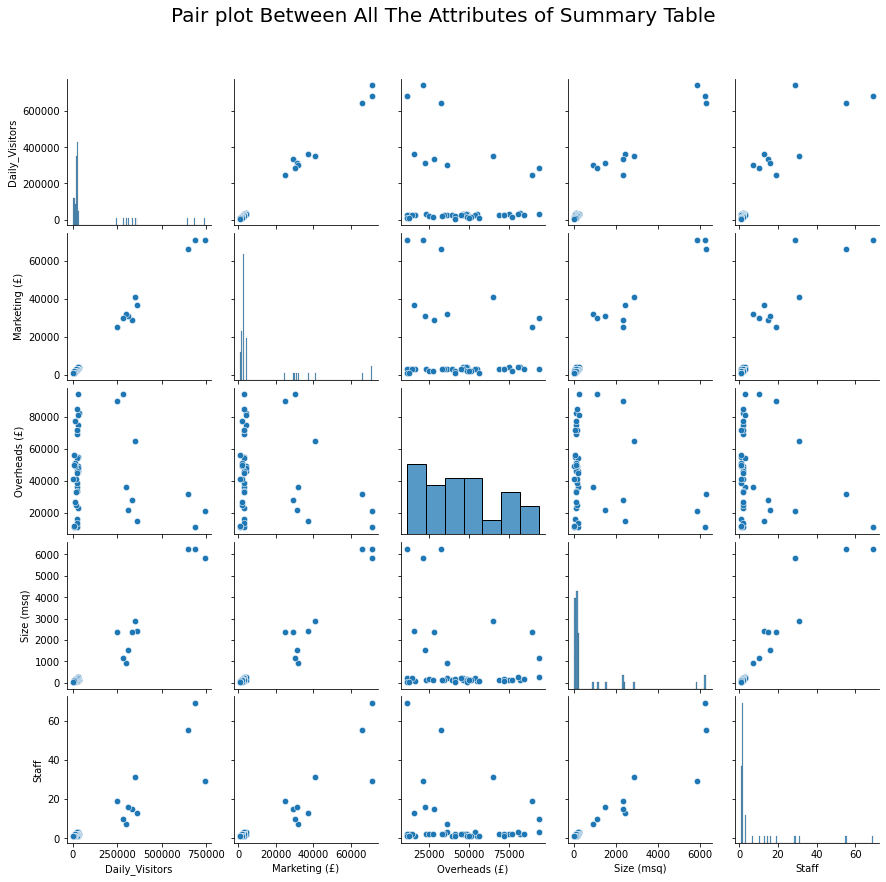

In [18]:
import seaborn as sns
sns.pairplot(df1_summary1, height=2.5, plot_kws={'s': 40})
plt.subplots_adjust(top=0.9)
plt.suptitle('Pair plot Between All The Attributes of Summary Table', fontsize = 20)
plt.show()

In [19]:
def get_correlation_plots(product_x, product_y):
    df2 = df1_summary1
    return df2.hvplot.scatter(frame_height=300, frame_width=300,
                             x=product_x, y=product_y,
                             title=product_x + ' vs ' + product_y,
                             size=10, padding=0.1) +\
           df2.corr().hvplot.heatmap(frame_height=300, frame_width=300,
                                    title='Attrbute correlations',
                                    rot=90, cmap='coolwarm'
                                   ).opts(invert_yaxis=True, clim=(-1, 1))

                             

In [20]:
correlation_title = '## Correlations'

product_x = pn.widgets.Select(name='x-axis', options=list(df1_summary1.columns), width=200)
product_y = pn.widgets.Select(name='y-axis', options=list(df1_summary1.columns), width=200)

correlation_row = pn.Row(
    pn.Column(correlation_title, product_x, product_y),
    get_correlation_plots(product_x.value, product_y.value)
)

def update_correlation_row(event):
    correlation_row[1].object = get_correlation_plots(product_x.value, product_y.value)

product_x.param.watch(update_correlation_row, 'value')
product_y.param.watch(update_correlation_row, 'value')

correlation_row.servable()  

Row
    [0] Column
        [0] Markdown(str)
        [1] Select(name='x-axis', options=['Daily_Visitors', ...], value='Daily_Visitors', width=200)
        [2] Select(name='y-axis', options=['Daily_Visitors', ...], value='Daily_Visitors', width=200)
    [1] HoloViews(Layout)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
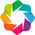

:Layout
   .Scatter.I   :Scatter   [Size (msq)]   (Staff)
   .Scatter.II  :Scatter   [Marketing (£)]   (Size (msq))
   .Scatter.III :Scatter   [Marketing (£)]   (Staff)
   .Scatter.IV  :Scatter   [Marketing (£)]   (Daily_Visitors)
   .Scatter.V   :Scatter   [Size (msq)]   (Daily_Visitors)

In [21]:
plot = df1_summary1.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='Size (msq)', y='Staff', title='Size (msq) vs Staff', 
    size=20
) + \
df1_summary1.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='Marketing (£)', y='Size (msq)', title='Marketing (£) vs Size (msq)',
     size=20
) + \
df1_summary1.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='Marketing (£)', y='Staff', title='Marketing (£) vs Staff',
     size=20
) + \
df1_summary1.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='Marketing (£)', y='Daily_Visitors', title='Marketing (£) vs Daily_Visitors',
     size=20
)+ \
df1_summary1.hvplot.scatter(
    frame_height=300, frame_width=300,
    x='Size (msq)', y='Daily_Visitors', title='Size (msq) vs Daily_Visitors',
     size=20
)
#hvplot.show(plot)
hv.extension('bokeh')
plot

#Exploring through each outlet and its attributes

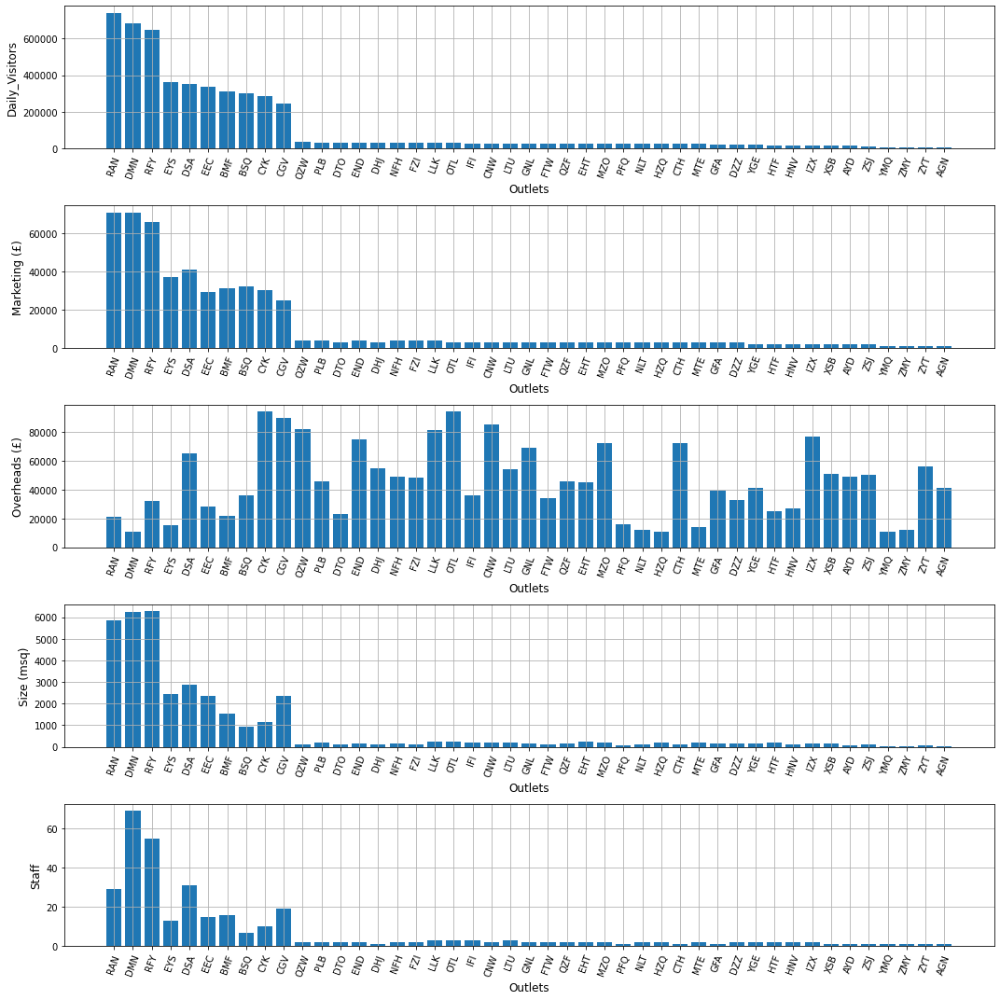

In [22]:
plt.figure(figsize=(15, 15))
counter = 1
x_pos = np.arange(len(df1_summary1.index))
for attribute in df1_summary1:
    sub = plt.subplot(5, 1, counter)
    sub.bar(x_pos, df1_summary1[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels(df1_summary1.index)
    sub.set_xlabel('Outlets', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    plt.xticks(rotation=70)
    plt.grid()
    counter += 1
    
plt.tight_layout()
plt.show()

#High

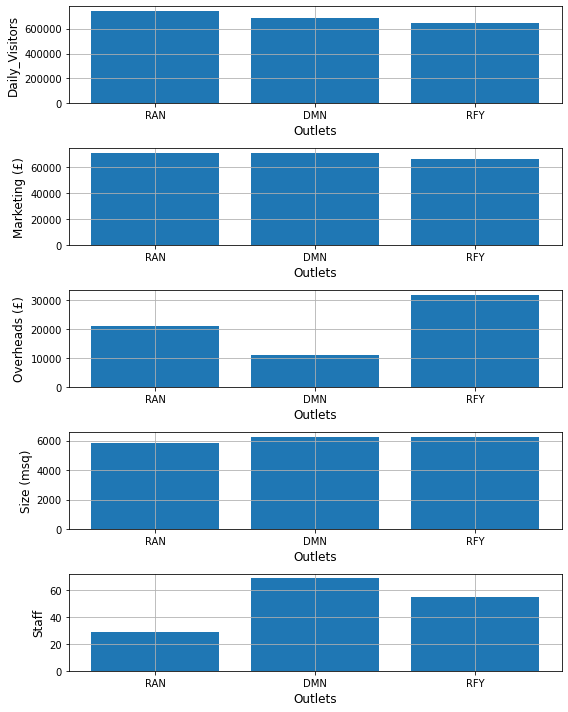

In [23]:
plt.figure(figsize=(8,10))
counter = 1

x_pos = np.arange(len((df1_summary1.loc[High]).index))
for attribute in (df1_summary1.loc[High]):
    sub = plt.subplot(5, 1, counter)
    sub.bar(x_pos, (df1_summary1.loc[High])[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels((df1_summary1.loc[High]).index)
    sub.set_xlabel('Outlets', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    plt.grid()
    counter += 1
plt.tight_layout()

plt.show()

#Medium

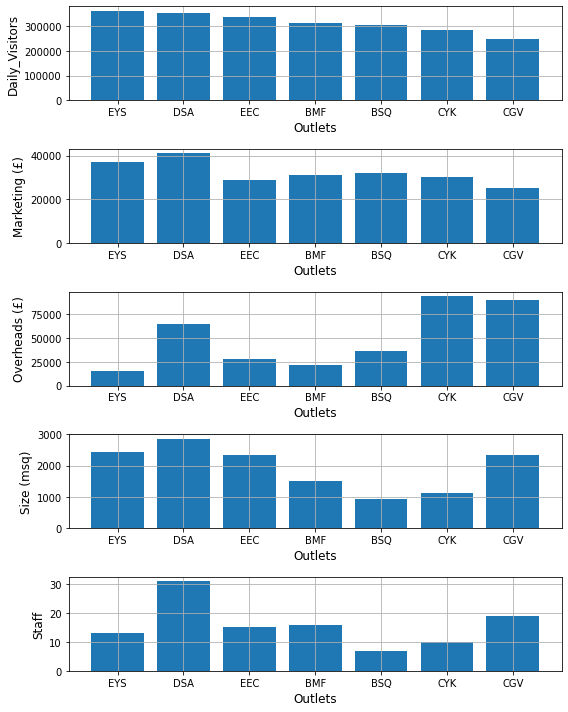

In [25]:
plt.figure(figsize=(8,10))
counter = 1

x_pos = np.arange(len((df1_summary1.loc[Medium]).index))
for attribute in (df1_summary1.loc[Medium]):
    sub = plt.subplot(5, 1, counter)
    sub.bar(x_pos, (df1_summary1.loc[Medium])[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels((df1_summary1.loc[Medium]).index)
    sub.set_xlabel('Outlets', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    plt.grid()
    counter += 1
plt.tight_layout()

plt.show()

#Low

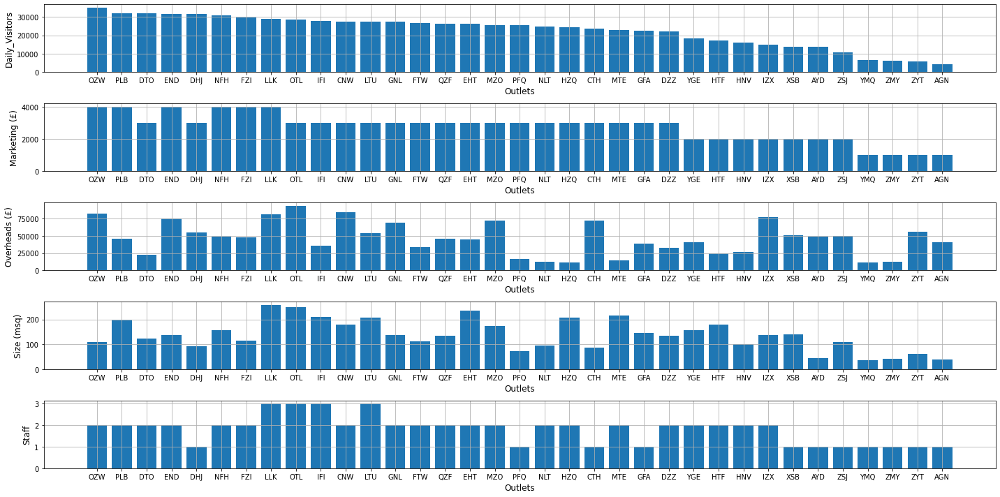

In [26]:
plt.figure(figsize=(20,10))
counter = 1

x_pos = np.arange(len((df1_summary1.loc[Low]).index))
for attribute in (df1_summary1.loc[Low]):
    sub = plt.subplot(5, 1, counter)
    sub.bar(x_pos, (df1_summary1.loc[Low])[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels((df1_summary1.loc[Low]).index)
    sub.set_xlabel('Outlets', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    plt.grid()
    counter += 1
plt.tight_layout()

plt.show()

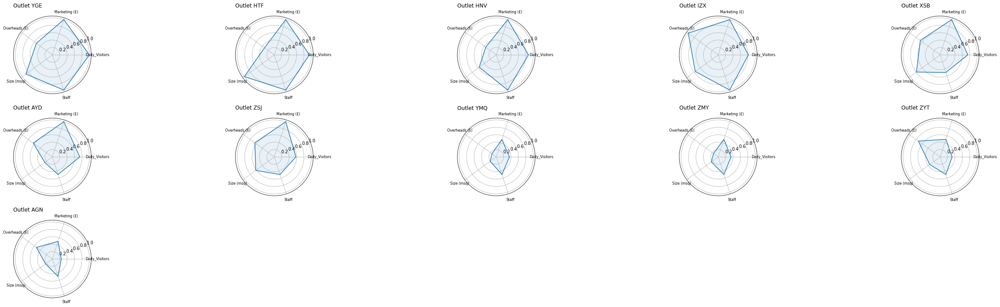

In [28]:
verylow=['YGE','HTF','HNV','IZX','XSB','AYD','ZSJ','YMQ','ZMY','ZYT','AGN']
normalised_data = df1_summary1 / df1_summary1.loc[verylow].max()

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]

plt.figure(figsize=(35, 16))
counter = 1
for name in df1_summary1.loc[verylow].index:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(5, 5, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title('Outlet ' + name, fontsize=12, loc='left')
    counter += 1
plt.tight_layout()
plt.show()